# Weather Map

The end goal of this map is to plot the weather data of the US. This will then be combined with an overlay of camp sites to enable users to select camp sites with the appropriate temperature conditions for a user specified time period. An additional goal is to also put in max distance from a location to narrow results, or from multiple locations to find intersecting points that are suitable for multiple parties to travel to.

This will be accomplished in multiple steps:
     
     A) Import and plot the location of weather stations on a map.
     B) Add a color encoding for the temperature at the weather station.
     C) Overlay the location of campsites. (This makes the product usable at the earliest stage)
     D) Interpolate values between stations to cover all of the US.
     E) Provide user input for time period to examine.
     F) Provide user input for search radius.

### Load packages

In [1]:
import altair as alt
import pandas as pd
from pathlib import Path
from matplotlib import pyplot as plt

## A) Import and plot the location of weather stations on a map.

### Read in Data

`Get current working directory to read in files:`

In [2]:
station_path = Path("__file__").parent / "./Data/ghcnd-stations.csv"

`Create a data frame of the station information`

In [3]:
station_df = pd.read_csv(station_path, header = None, names = ['id', 'latitude', 'longitude', 'elevation', 'location', 'flag', 'wmo_id'])

`Check the packaging`

In [4]:
station_df.shape

(119503, 7)

In [5]:
station_df.head()

,id,latitude,longitude,elevation,location,flag,wmo_id
0,ACW00011604,17.1167,-61.7833,10.1,ST JOHNS COOLIDGE FLD,NaN,NaN
1,ACW00011647,17.1333,-61.7833,19.2,ST JOHNS,NaN,NaN
2,AE000041196,25.3330,55.5170,34.0,SHARJAH INTER. AIRP,GSN,41196.0
3,AEM00041194,25.2550,55.3640,10.4,DUBAI INTL,NaN,41194.0
4,AEM00041217,24.4330,54.6510,26.8,ABU DHABI INTL,NaN,41217.0


In [6]:
station_df.tail()

,id,latitude,longitude,elevation,location,flag,wmo_id
119498,ZI000067969,-21.050,29.367,861.0,WEST NICHOLSON,NaN,67969.0
119499,ZI000067975,-20.067,30.867,1095.0,MASVINGO,NaN,67975.0
119500,ZI000067977,-21.017,31.583,430.0,BUFFALO RANGE,NaN,67977.0
119501,ZI000067983,-20.200,32.616,1132.0,CHIPINGE,GSN,67983.0
119502,ZI000067991,-22.217,30.000,457.0,BEITBRIDGE,NaN,67991.0


### Clean the Data

`Drop unwanted columns`

In [7]:
station_df = station_df.drop(['flag','wmo_id'], axis = 1)

`Drop non-US locations`

In [8]:
station_df = station_df[station_df['id'].str.contains('US')]

In [9]:
station_df['state'] = station_df['location'].str[0:2]
station_df['name'] = station_df['location'].str[2:]
station_df = station_df.drop('location', axis = 1)
station_df = station_df.reset_index(drop = True)

In [10]:
station_df.shape

(66104, 6)

In [11]:
station_df.head()

,id,latitude,longitude,elevation,state,name
0,US009052008,43.7333,-96.6333,482.0,SD,SIOUX FALLS (ENVIRON. CANAD
1,US10RMHS145,40.5268,-105.1113,1569.1,CO,RMHS 1.6 SSW
2,US10adam001,40.5680,-98.5069,598.0,NE,JUNIATA 1.5 S
3,US10adam002,40.5093,-98.5493,601.1,NE,JUNIATA 6.0 SSW
4,US10adam003,40.4663,-98.6537,615.1,NE,HOLSTEIN 0.1 NW


### Check the n's

Checking to make sure there are no extremes for the values.

In [12]:
station_df.describe()

,latitude,longitude,elevation
count,66104.000000,66104.000000,66104.000000
mean,38.648787,-96.609824,547.426597
std,6.034725,16.992243,668.544202
min,18.916700,-178.033300,-999.900000
25%,34.816375,-105.816700,135.000000
50%,39.130400,-95.208500,283.800000
75%,42.146900,-83.891500,732.400000
max,71.324400,179.283300,4198.000000


Check there are no duplicate stations

In [13]:
station_df['id'].nunique()

66104

There are 52 'States' listed. This likely includes territories or DC

In [14]:
station_df['state'].nunique()

52

This does confirm that it includes DC and UM(US Minor Outlying Islands)

In [15]:
station_df['state'].value_counts()

TX    5475
CO    4364
CA    2921
NC    2365
NE    2273
NM    2059
KS    2020
IL    1918
FL    1912
OR    1885
IN    1768
NY    1698
MN    1593
AZ    1565
TN    1534
WA    1529
MO    1478
PA    1418
MI    1317
GA    1284
SC    1269
MT    1244
WY    1214
OH    1206
VA    1174
WI    1128
SD    1050
AL    1025
OK    1023
AK    1004
UT     929
IA     914
AR     885
KY     862
ID     802
NJ     753
HI     753
LA     739
MD     706
NV     687
MA     684
MS     629
ND     549
ME     539
WV     520
NH     439
CT     360
VT     339
RI     159
DE     125
DC      17
UM       1
Name: state, dtype: int64

`Drop US Minor Outlying Islands`

In [16]:
station_df = station_df[station_df['state'] != 'UM']

### Validate against an external data source

Data is provided by the NOAA which is a reputable government organization.

### Visualization

`Using the albersUSA map`

In [17]:
url = "https://raw.githubusercontent.com/vega/vega-datasets/main/data/us-10m.json"
feature = "states"
alt.data_transformers.enable('default', max_rows=None)
source = alt.topo_feature(url, feature)

In [18]:
base = alt.Chart(source).mark_geoshape(
    fill='lightgray',
    stroke='white'
).project('albersUsa').properties(
    width=800,
    height=600
)

In [19]:
points = alt.Chart(station_df).mark_circle().encode(
    longitude='longitude:Q',
    latitude='latitude:Q',
    #size=alt.Size('30', title='Location'),
    color=alt.value('red')
)

In [20]:
base + points

alt.LayerChart(...)

## B) Add a color encoding for the temperature at the weather station.

## Read in Data

`Get current working directory to read in files:`

In [21]:
weather_path = Path("__file__").parent / "./data/2015.csv"

`Create a data frame of the weather information`

In [22]:
weather_df = pd.read_csv(weather_path, header = None, names = ['id', 'date', 'category', 'value', '1', '2', '3', '4'])

`Check the packaging`

In [23]:
weather_df.shape

(35365260, 8)

In [24]:
weather_df.head()

,id,date,category,value,1,2,3,4
0,AE000041196,20150101,TMIN,125,NaN,NaN,S,NaN
1,AE000041196,20150101,PRCP,0,NaN,NaN,S,NaN
2,AE000041196,20150101,TAVG,206,H,NaN,S,NaN
3,AEM00041194,20150101,TMAX,286,NaN,NaN,S,NaN
4,AEM00041194,20150101,TMIN,180,NaN,NaN,S,NaN


In [25]:
weather_df.tail()

,id,date,category,value,1,2,3,4
35365255,ZI000067975,20151231,TAVG,240,H,NaN,S,NaN
35365256,ZI000067983,20151231,TMAX,260,NaN,NaN,S,NaN
35365257,ZI000067983,20151231,TMIN,176,NaN,NaN,S,NaN
35365258,ZI000067983,20151231,PRCP,30,NaN,NaN,S,NaN
35365259,ZI000067983,20151231,TAVG,217,H,NaN,S,NaN


## Clean the Data

`Drop Unwanted Columns`

In [26]:
weather_df = weather_df.drop(['1','2','3','4'], axis = 1)

`Drop non-US locations`

In [27]:
weather_df = weather_df[weather_df['id'].str.contains('US')]

`Only take the average temperature for now`

This will be changed in the future to also allow for minimum and maximum temperatures. Using average temperature helps get a solution built quicker since those are unneccesary features.

In [28]:
weather_df = weather_df[weather_df['category'] == 'TAVG']
weather_df = weather_df.rename(columns = {"value" : "temperature"})

`Similarly also only take dates around July 4th.`

In [29]:
weather_df = weather_df[(weather_df['date'] <= 20150714) & (weather_df['date'] >= 20150628)]

In [30]:
weather_df = weather_df.groupby(by = 'id').mean().reset_index() # average the temperatures around July 4th for each station
weather_df['date'] = 20150704 # reset the date

`Add decimal point to weather values by dividing column by 10.`

In [31]:
weather_df['temperature'] = weather_df['temperature'].div(10)

`Convert Celsius to Farenheit for US users`

In [32]:
weather_df['temperature'] = weather_df['temperature'] * 9/5 + 32

`Set date to proper format`

In [33]:
weather_df['date'] = pd.to_datetime(weather_df['date'].astype(str), format='%Y%m%d')

In [34]:
weather_df.shape

(2380, 3)

## Check the n's

The weather seems good for the most part. There is an extreme low, but could be possible in some northern regions so it is best to explore further.

In [35]:
weather_df.describe()

,temperature
count,2380.000000
mean,66.622729
std,9.164213
min,-9.812941
25%,59.709412
50%,66.332353
75%,73.161765
max,95.349412


This shows that temperatures less than 40 are extreme outliers. So for this case it is best to drop any extremeley low values.

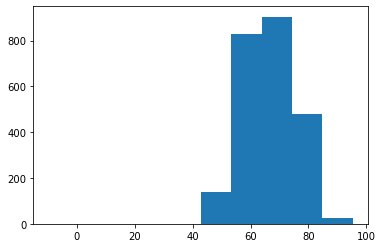

In [36]:
plt.hist(weather_df['temperature'])
plt.show()

Anything below 20 looks like an extreme outlier. So we will drop those. It is best for the future to find a better way to identify outliers, since they may still be accurate.

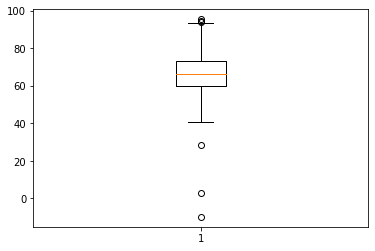

In [37]:
plt.boxplot(weather_df['temperature'])
plt.show()

In [38]:
weather_df = weather_df[weather_df['temperature'] > 20]

## Validate against an external data source

In [39]:
### Finding a data source with record US temperature would help to see if there are outliers

## Visualization

`only keep stations that we have weather data for`

In [40]:
station_df2 = station_df[station_df['id'].isin(weather_df['id'])].reset_index(drop= True)
station_df2.shape[0] == weather_df.shape[0]

True

In [41]:
url = "https://raw.githubusercontent.com/vega/vega-datasets/main/data/us-10m.json"
feature = "states"
source = alt.topo_feature(url, feature)

In [42]:
base = alt.Chart(source).mark_geoshape(
    fill='lightgray',
    stroke='white'
).project('albersUsa').properties(
    width=800,
    height=600
)

In [43]:
points = alt.Chart(station_df2).mark_circle().encode(
    longitude='longitude:Q',
    latitude='latitude:Q',
    size=alt.value(30),
    color=alt.Color('temperature:Q', scale=alt.Scale(scheme='viridis'), title = 'Average July 4th Temperature')
).transform_lookup(
    lookup='id',
    from_=alt.LookupData(weather_df, 'id', ['id', 'temperature'])
)

In [44]:
base + points

alt.LayerChart(...)

In [45]:
# Why are there only about 2400 weather stations with data out of 66000?
# Are there more that report TMAX or TMIN?
# What is the best way to hand outliers?
    # Maybe bin the outliers into one large temperature chunk and apply finer bins for other values to distinguish differences.